In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip '/content/drive/MyDrive/Colab Notebooks/birdclef-2022.zip'

In [2]:
import numpy as np
import pandas as pd
import os
import glob
import librosa
import matplotlib.pyplot as plt
import librosa.display
import sklearn
import plotly.express as px
import cufflinks as cf
import random
import seaborn as sns
import tensorflow as tf

from sklearn.metrics import accuracy_score
from tensorflow.keras import regularizers
from IPython.display import Audio
from plotly.offline import iplot

cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

C:\Users\dajka\Anaconda3\lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


1. [Introduction](#1)  
2. [Exploratory Data Analysis](#2)  
    * [Load Dataset](#21)
    * [Bird Species Analysis](#22)
    * [Recordings by Geographical Location](#23)
    * [Other Features ](#24)  
3. [Audio Data Analysis](#3)   
    * [Training Data](#31)
    * [Spectrogram Analysis](#32)
4. [Data Augmentation](#4) 
    * [Raw Audio Augmentation](#41)
    * [SpecAugmentation](#42)
5. [Data Pipeline](#5)
    * [Load Data](#51)
    * [First Augmentation](#52)
    * [Transform to Spectogram](#53)
6. [Model](#6)
    * [Define Model](#61)
    * [Train Model](#62)
    * [Make Predictions](#63)
7. [Bibliography](#7)

# 1. Introduction<a id="1"></a> <br>

This notebook is my chosen project for the `2022/23/1 Data Mining and Machine Learning` course. The dataset we're going to use is from the [BirdCLEF 2022](https://www.kaggle.com/competitions/birdclef-2022) competition dataset. The purpose of the competetion, is to help reasearchers understand how changes in the enviroment effect species, that are living difficult-to-access, high-elevation habitats by help developing bioacustic monitoring systems. The goal of the project thereby is to develop a model that can process continuous audio data and then acoustically recognize the species.

# 2. Exploratory Data Analysis<a id="2"></a> <br>

## <font size='4'> Load Dataset</font><a id='21'></a>

We're going to read the table containing the metadata for the audio files, provided with the training and test samples. It contains important columns:

- `primary_label` - is the code for the species of bird for each audio file
- `secondary_labels` - is the background species as annotated by the recordist
- `filename` - the associated audio file
- `latitude/longitude` - are the recording locations for the audio files
- `rating` - float value between 0.0 and 5.0 as an indicator of the quality rating on [Xeno-canto](https://xeno-canto.org/) and the number of background species

In [3]:
metadata = pd.read_csv('train_metadata.csv')

In [4]:
metadata.head()

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,time,url,filename
0,afrsil1,[],"['call', 'flight call']",12.3910,-1.4930,Euodice cantans,African Silverbill,Bram Piot,Creative Commons Attribution-NonCommercial-Sha...,2.5,08:00,https://www.xeno-canto.org/125458,afrsil1/XC125458.ogg
1,afrsil1,"['houspa', 'redava', 'zebdov']",['call'],19.8801,-155.7254,Euodice cantans,African Silverbill,Dan Lane,Creative Commons Attribution-NonCommercial-Sha...,3.5,08:30,https://www.xeno-canto.org/175522,afrsil1/XC175522.ogg
2,afrsil1,[],"['call', 'song']",16.2901,-16.0321,Euodice cantans,African Silverbill,Bram Piot,Creative Commons Attribution-NonCommercial-Sha...,4.0,11:30,https://www.xeno-canto.org/177993,afrsil1/XC177993.ogg
3,afrsil1,[],"['alarm call', 'call']",17.0922,54.2958,Euodice cantans,African Silverbill,Oscar Campbell,Creative Commons Attribution-NonCommercial-Sha...,4.0,11:00,https://www.xeno-canto.org/205893,afrsil1/XC205893.ogg
4,afrsil1,[],['flight call'],21.4581,-157.7252,Euodice cantans,African Silverbill,Ross Gallardy,Creative Commons Attribution-NonCommercial-Sha...,3.0,16:30,https://www.xeno-canto.org/207431,afrsil1/XC207431.ogg


In [5]:
metadata['secondary_labels'] = metadata['secondary_labels'].apply(eval)
metadata['type'] = metadata['type'].apply(eval)

## <font size='4'> Bird Species Analysis </font><a id='22'></a>

In [6]:
print("Number of unique primary species of birds in train dataset: %d"%metadata.primary_label.nunique())

Number of unique primary species of birds in train dataset: 152


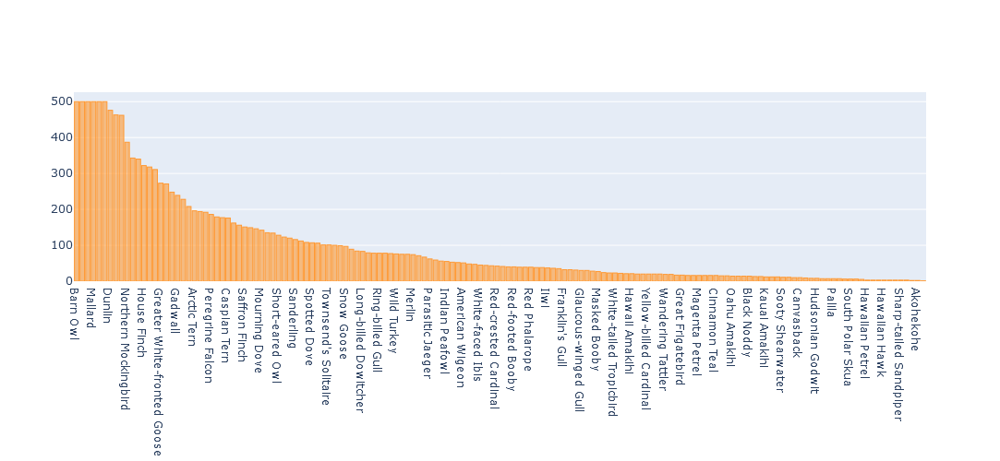

In [7]:
layout = cf.Layout(height=500,width=1000) # secify layout so the image is more readable

# Species distribution in the trainig dataset
metadata['common_name'].value_counts().sort_values(ascending = False).iplot(kind='bar', layout=layout)

We can see a huge discrepancy in the number of recordings for the different species, that is in part why we need to augment the training data, to avoid choosing only the species with the most recordings all the time.

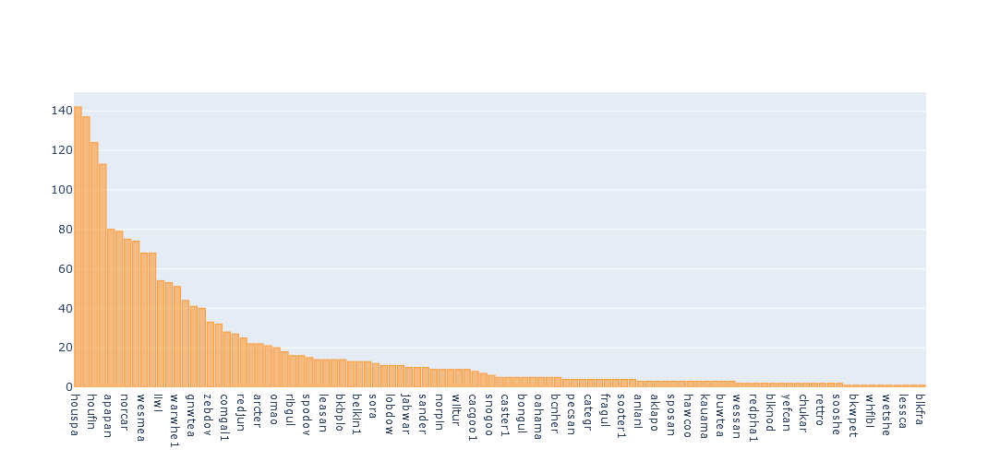

In [8]:
# Distribution of the secondary labels in the trainig dataset
metadata['secondary_labels'].explode().value_counts().iplot(kind='bar', layout=layout)

## <font size='4'> Recordings by Gographical Location </font><a id='23'></a>

We can take a look where each audio files was recorded:

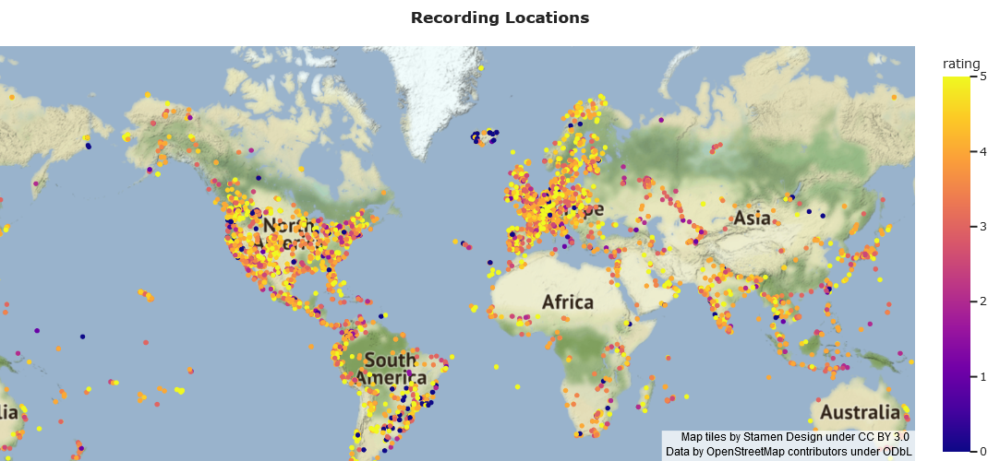

In [9]:
fig = px.scatter_mapbox(metadata,
                lat='latitude',
                lon='longitude',
                color='rating',
                hover_name='common_name',
                hover_data=['secondary_labels','type','time'],
                color_continuous_scale=px.colors.sequential.Plasma,
                mapbox_style='stamen-terrain',
                zoom=0.9)

fig.update_geos(fitbounds="locations", visible=True)
fig.update_geos(projection_type="mercator")

fig.update_layout(height=500,width=1070, margin={"r":0,"t":50,"l":0,"b":0})
fig.update_layout(title='<b>Recording Locations</b>',template='seaborn', hoverlabel=dict(bgcolor="white", font_size=16, font_family="Rockwell"))
fig.show()

## <font size='4'> Other Features </font><a id='24'></a>

Distribution of sound `types` in the trainig dataset:

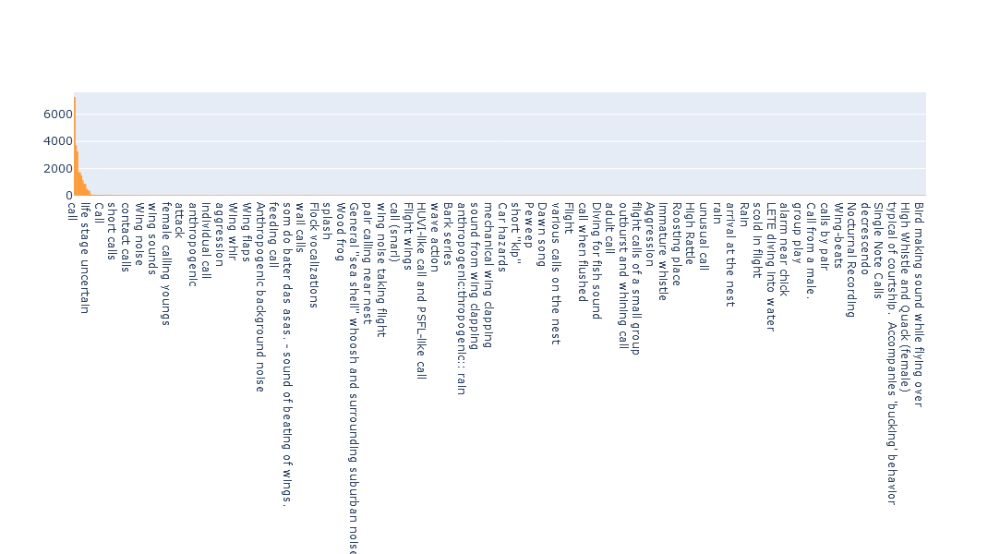

In [10]:
metadata['type'].explode().value_counts().iplot(kind='bar', layout=cf.Layout(height=600,width=1000))

`Ratings` distribution in the trainig dataset:

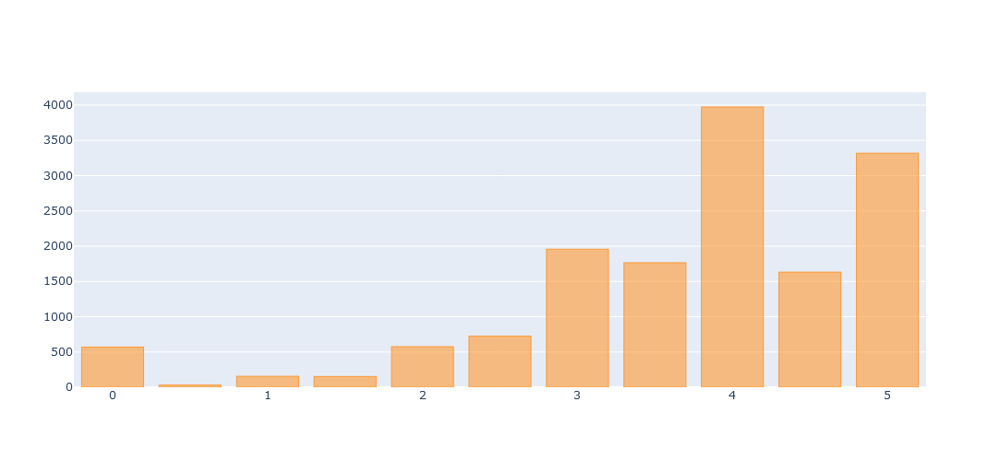

In [11]:
metadata['rating'].value_counts().sort_values(ascending = False).iplot(kind='bar', layout=layout)

# Audio Data Analysis<a id='3'></a>

In [12]:
# Load the audio files
rootdir = 'train_audio'

audio_files = []
for subdir, dirs, files in os.walk(rootdir):
    for file in files:
        audio_files.append(os.path.join(subdir, file))
        
species = next(os.walk(rootdir), (None, None, []))[1] 

## <font size='4'>Training Data</font><a id='31'></a>

The next step is to get familiar with the training data, so we're going to look at some samples and transform them to spectogram form.

In [13]:
np.random.seed(7)
index = np.random.randint(0, len(audio_files))
print('The sound of a %s'%metadata.common_name.values[index])
Audio(audio_files[index])

The sound of a Saffron Finch


It's this little thing:
![](https://cdn.download.ams.birds.cornell.edu/api/v1/asset/55142651/1800)

We can also take a look at the audio file itself:

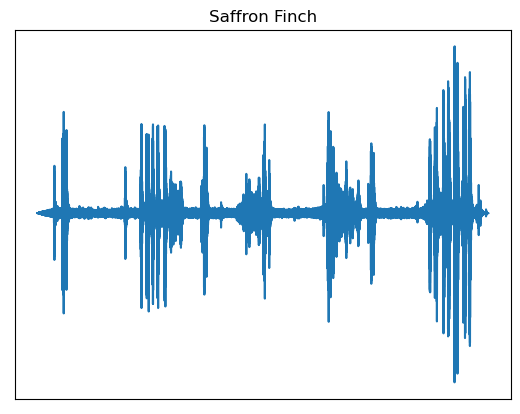

In [14]:
sample, sample_rate = librosa.load(audio_files[index], sr=32000)
plt.plot(sample)
plt.xticks([])
plt.yticks([])
plt.title(metadata.common_name.values[index])
plt.show()

And here's some more:

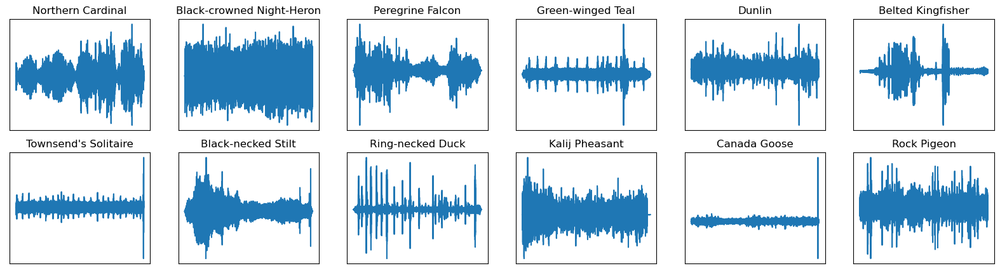

In [15]:
fig, axes = plt.subplots(2, 6, figsize=([20,5]))
for i, ax in enumerate(axes.flat):
    idx = np.random.randint(0, len(audio_files))
    sample, sample_rate = librosa.load(audio_files[idx], sr=None)
    ax.plot(sample)
    ax.set_xticks([]); ax.set_yticks([])
    ax.set_title(metadata.common_name.values[idx])
plt.show()

They have differing amplitudes and the amount of background noise differs aswell.

## <font size='4'>Spectrogram Analysis</font><a id='32'></a>

The most common way to process these types of data before using machine learning methods on them is to transform them to a __spectrogram__, which is the represantation of a sound sample's spectrum of frequencies, it has two geometrical dimensions and one third one, color, indicating the _Amplitude_. The x-axis is _Time_ and the y-axis is _Frequency_ on the spectrogram. The benefit of this method is that we can get more information out of the recordings by extending the number of dimensions and we can also use __Convolutional Neural Networks__ for the classification model, because we are basically using images now instead of audio data.

Using the full spectrum of the sound files is not benefitial, because birds make sounds in a very tiny interval of the full frequency spectrum, so  we are going to use a __log-scaled Mel Spectrogram__, which differs in two important things from a regular spectrogram:

- It uses the _Mel Scale_ instead of _Frequency_ on the y-axis.
- It uses the _Decibel Scale_ instead of _Amplitude_ to indicate colors.

The _Mel Scale_ is adjusted roughly to what a human actually hear as an equal distance in pitch and the _Decibel Scale_ is a exponentially increasing measurement in loudness. 

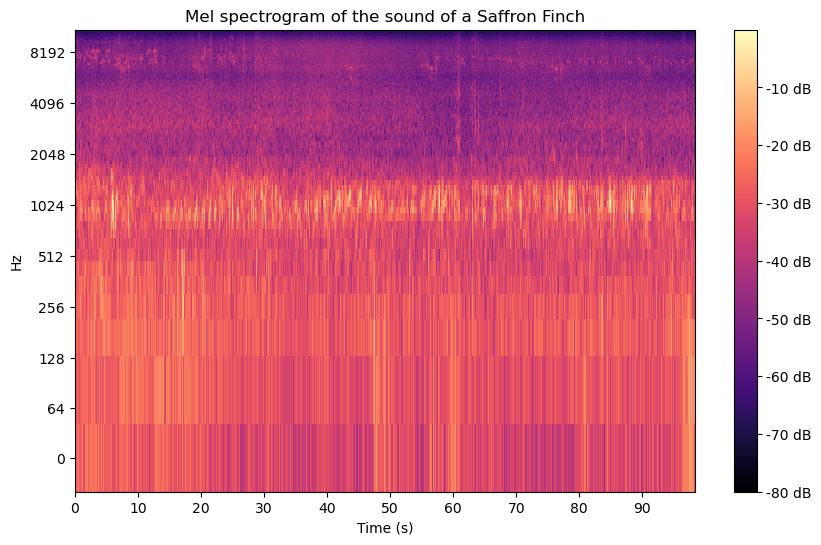

Mel Spectrogram is of type <class 'numpy.ndarray'> with shape (128, 4234)


In [16]:
# Transform the sample to a Mel Spectrogram
def log_mel(sample, sample_rate):
    
    msg = librosa.feature.melspectrogram(y=sample, sr=sample_rate)
    msg = librosa.power_to_db(msg, ref=np.max)
    
    return msg

msg_finch = log_mel(sample, sample_rate)

fig, ax = plt.subplots(figsize=([10,6]))
img = librosa.display.specshow(msg_finch, x_axis='s', y_axis='log', ax=ax)
fig.colorbar(img, format='%+2.0f dB', ax=ax)
plt.title('Mel spectrogram of the sound of a %s'%metadata.common_name.values[index])
plt.show()
print (f'Mel Spectrogram is of type {type(msg_finch)} with shape {msg_finch.shape}')

We can see the Mel Spectrogram of other samples:

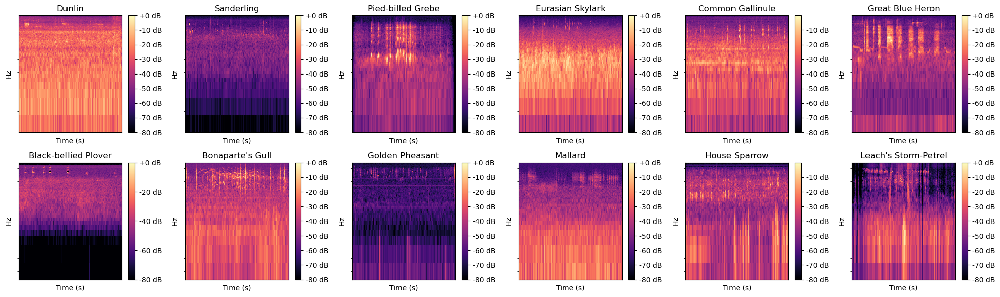

In [17]:
fig, axes = plt.subplots(2, 6, figsize=([20,6]))
for i, ax in enumerate(axes.flat):
    idx = np.random.randint(0, len(audio_files))
    sample, sample_rate = librosa.load(audio_files[idx], sr=None)

    msg = librosa.feature.melspectrogram(y=sample, sr=sample_rate)
    msg = librosa.power_to_db(msg, ref=np.max)

    img = librosa.display.specshow(msg, x_axis='s', y_axis='log', ax=ax)
    fig.colorbar(img, format='%+2.0f dB', ax=ax)
    ax.set_xticks([]); ax.set_yticks([])
    ax.set_title(metadata.common_name.values[idx])
plt.tight_layout()
plt.show()

# Data Augmentation <a id='4'></a>

As we saw, the distribuiton of species is not nearly equal, which can cause the model to develop a high level of bias and we don't want that to happen. Fortunately we can use augemtation techniques, to make copies of certain samples with small differences that still preserve the core information from the audio to help our model learn them better. We're going to look at two types of augmentation methods:

- __Raw Audio Augmnetation__, where we transform the signal before we transform it to a spectogram

- __SpecAugmentation__, where we make copies by blocking out parts of a spectrogram

## <font size='4'>Raw Audio Augmnetation</font><a id='41'></a>

In the articles in the bibligraphy, the authors mention different methods of augmenting the audio data we could use:

In [18]:
sample, sample_rate = librosa.load(audio_files[index], sr=32000)

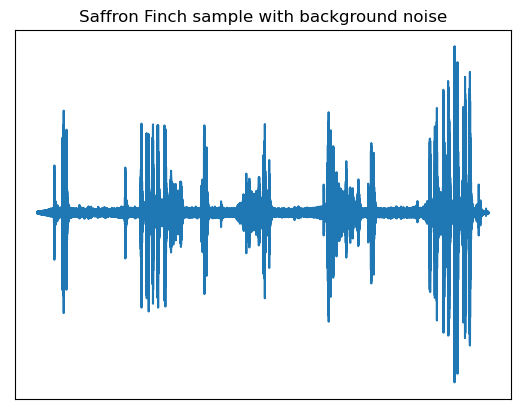

In [19]:
# Background noise
def background_noise(sample):
    
    noise_amplitude = np.random.uniform(low=0.0, high=0.02)
    noise = np.random.randn(len(sample))
    noisy_sample = (sample + noise * noise_amplitude).astype(sample.dtype)
    
    return noisy_sample

plt.plot(background_noise(sample))
plt.xticks([])
plt.yticks([])
plt.title('%s sample with background noise'%metadata.common_name.values[index])
plt.show()

In [20]:
Audio(background_noise(sample), rate=sample_rate)

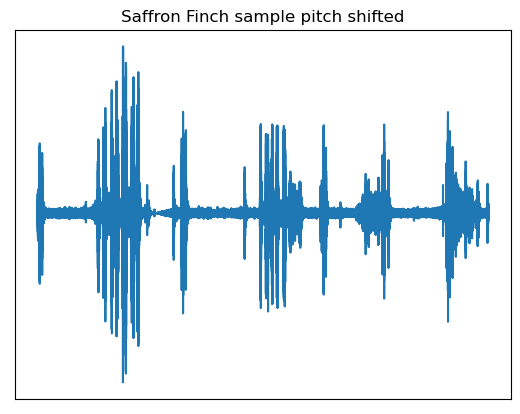

In [21]:
# Pitch shifting
def picth_shift(sample):
    
    max_shift = 3000000
    shift = np.random.randint(-max_shift, max_shift)
    shifted_sample = np.roll(sample, shift)
    
    return shifted_sample

plt.plot(picth_shift(sample))
plt.xticks([])
plt.yticks([])
plt.title('%s sample pitch shifted'%metadata.common_name.values[index])
plt.show()

In [22]:
Audio(picth_shift(sample), rate=sample_rate)

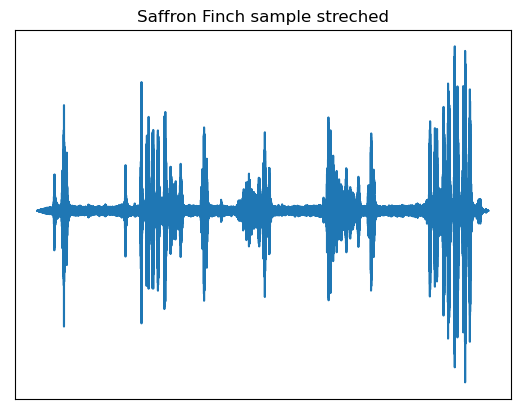

In [23]:
# Time strecthing
def time_strech(sample):
    
    max_rate = 25
    rate = np.random.uniform(0, max_rate)
    streched_sample = librosa.effects.time_stretch(sample, rate=rate)
    
    return streched_sample

plt.plot(time_strech(sample))
plt.xticks([])
plt.yticks([])
plt.title('%s sample streched'%metadata.common_name.values[index])
plt.show()

In [24]:
Audio(time_strech(sample), rate=sample_rate)

## <font size='4'>SpecAugmnetation</font><a id='42'></a>

The normal transforms you would use for an image don’t apply to spectrograms. For instance, a horizontal flip or a rotation would substantially alter the spectrogram and the sound that it represents.

Instead, we use a method known as __SpecAugment__ where we block out sections of the spectrogram. There are two flavors:

- _Frequency mask_ — randomly mask out a range of consecutive frequencies by adding horizontal bars on the spectrogram.
- _Time mask_ — similar to frequency masks, except that we randomly block out ranges of time from the spectrogram by using vertical bars.

In [25]:
# Frequency mask
def freq_mask(sgram, F=50, num_masks=1):
    test = np.copy(sgram)
    num_mel_channels = test.shape[0]
    for i in range(0, num_masks):        
        freq = random.randrange(0, F)
        zero = random.randrange(0, num_mel_channels - freq)
        # avoids randrange error if values are equal and range is empty
        if (zero == zero + freq): return test
        mask_end = random.randrange(zero, zero + freq) 
        test[zero:mask_end] = test.mean()
    return test

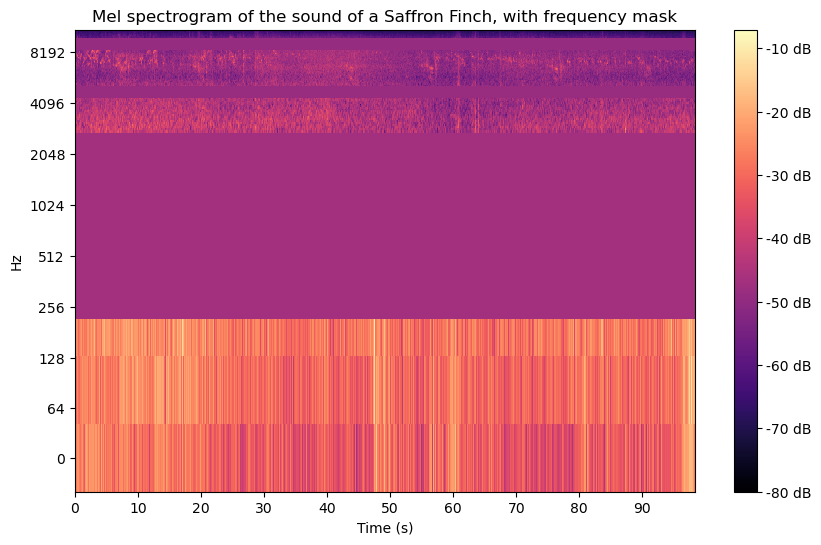

In [26]:
fig, ax = plt.subplots(figsize=([10,6]))
img = librosa.display.specshow(freq_mask(msg_finch, num_masks=5), x_axis='s', y_axis='log', ax=ax)
fig.colorbar(img, format='%+2.0f dB', ax=ax)
plt.title('Mel spectrogram of the sound of a %s, with frequency mask'%metadata.common_name.values[index])
plt.show()

In [27]:
# Time mask
def time_mask(sgram, time=100, num_masks=1):
    test = np.copy(sgram)
    length = test.shape[1]
    for i in range(0, num_masks):
        t = random.randrange(0, time)
        zero = random.randrange(0, length - t)
        if (zero == zero + t): return test
        mask_end = random.randrange(zero, zero + t)
        test[:,zero:mask_end] = test.mean()
    return test

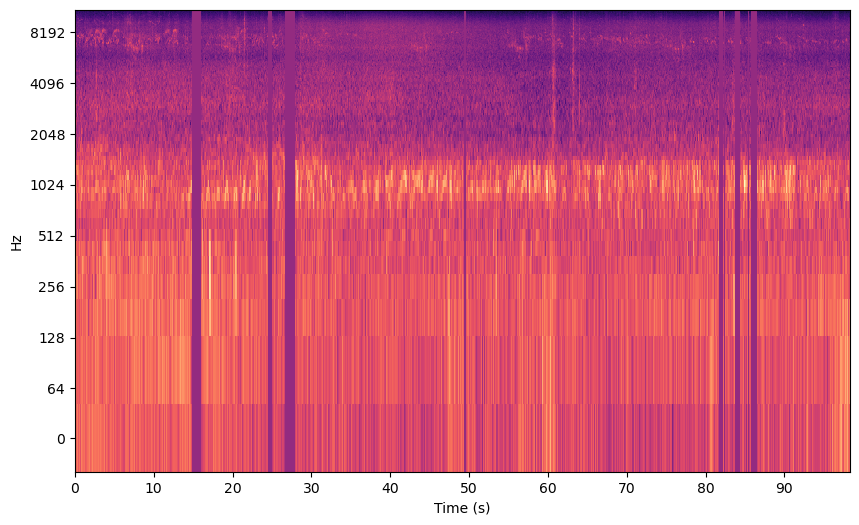

In [28]:
fig, ax = plt.subplots(figsize=([10,6]))
img = librosa.display.specshow(time_mask(msg_finch, num_masks=10), x_axis='s', y_axis='log', ax=ax)

We can use these methods to augment the audio data and then feed it to a neural network, but because our data is memory-intensive, so we'll need to load it in batches during model training.

# Data Pipline <a id='5'></a>

We're going to define the data reading pipeline for the training of the model. We'll fix the size of the audio samples to a certian size. For that we're going to use the average lenght of the recordings.

In [ ]:
# Estimate average length
mean_lenghts = []
for i in range(10):
    lenghts = []
    for j in range(100):
        idx = np.random.randint(0, len(audio_files))
        lenghts.append(len(librosa.load(audio_files[idx], sr=32000)[0]))
    mean_lenghts.append(np.mean(lenghts))

In [ ]:
np.mean(mean_lenghts)

I have already ran this a couple times, so we're going to use one of those results.

## <font size='4'>Load Data</font><a id='51'></a>

In [30]:
def load_audio_file(file_path):
    
    input_length = 1374758 # max length
    sample, sample_rate = librosa.load(file_path, sr=32000, mono=True)
    
    # If the data isn't long enough we're going to pad it to the required lenght
    if len(sample)>input_length:
        sample = sample[:input_length]
    else:
        sample = np.pad(sample, (0, max(0, input_length - len(sample))), "constant")
        
    return sample

Load all data from a species.

In [31]:
def species_loader(species):
    
    samples = []
    for filename in glob.glob(os.path.join(os.path.join(rootdir, species), '*.ogg')):
        samples.append(load_audio_file(filename))
        
    return samples

## <font size='4'>First Augmentation</font><a id='52'></a>

The next step is to augment the audio data. We're going to make copies of the samples in a folder until we get to a certain number of samples, let's say a 500 samples.

In [32]:
def audio_augmentation(func, samples, size):
    
    augmented_samples = []
    
    while (len(augmented_samples) + len(samples)) < size:
        idx = np.random.randint(0, len(samples))
        augmented_samples.append(func(samples[idx]))
        
    fin_samps = np.concatenate((augmented_samples, samples), axis=0)
    
    return fin_samps

## <font size='4'>Transform to Spectogram</font><a id='53'></a>

Transform the aduio data into spectograms.

In [33]:
def spec_transformer(samples):
    
    specs = []
    for sample in samples:
        specs.append(log_mel(sample, 32000))
    
    return specs

## <font size='4'>Second Augemntation</font><a id='54'></a>

The second augmentation is using the SpecAugmentation methods.

In [34]:
def spec_augmentation(samples, size):
    
    augmented_samples = []
    
    while (len(augmented_samples) + len(samples)) < size:
        idx = np.random.randint(0, len(samples))
        freq_masked_sample = freq_mask(samples[idx], F=50, num_masks=1)
        time_masked_sample = time_mask(freq_masked_sample, time=100, num_masks=1)
        augmented_samples.append(time_masked_sample)
    
    fin_samps = np.concatenate((augmented_samples, samples), axis=0)
    
    return fin_samps

Quick test of the pipline.

In [35]:
test_samples = species_loader(species[0])

In [36]:
test_aug_audio = audio_augmentation(background_noise, test_samples, 20)

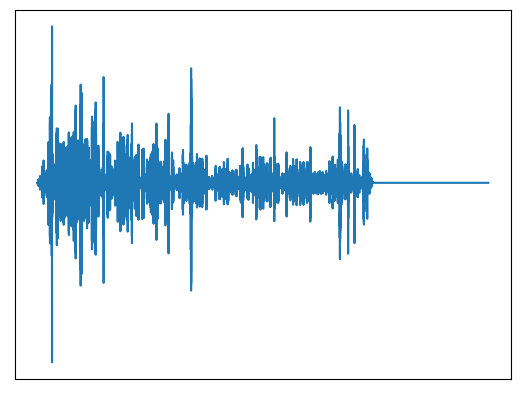

In [42]:
plt.plot(test_aug_audio[13])
plt.xticks([])
plt.yticks([])
plt.show()

In [43]:
specs = spec_transformer(test_aug_audio)

In [44]:
aug_specs = spec_augmentation(specs, 60)

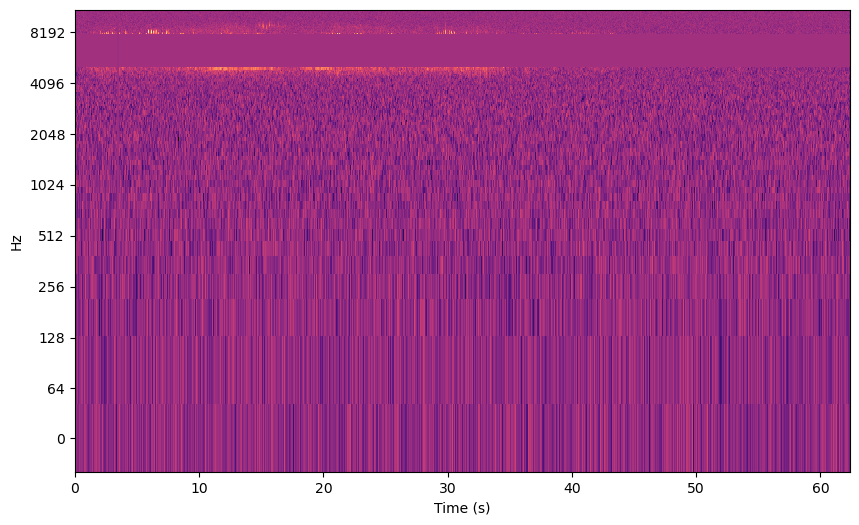

In [49]:
fig, ax = plt.subplots(figsize=([10,6]))
img = librosa.display.specshow(aug_specs[24], x_axis='s', y_axis='log', ax=ax)

# Model <a id='6'></a>

## <font size='4'>Build Model</font><a id='61'></a>

Now we can build our model. This one is based of the models used in the two sound classification papers below in the bibliography.

In [41]:
model = tf.keras.Sequential()

inputs = tf.keras.layers.Input(shape=(128, 2686, 1))

model.add(tf.keras.layers.Conv2D(filters=24, kernel_size=(5,5), activation='relu'))
model.add(tf.keras.layers.MaxPool2D(strides=(4,2)))

model.add(tf.keras.layers.Conv2D(filters=48, kernel_size=(5,5), activation='relu', kernel_regularizer=regularizers.L2(0.001)))
model.add(tf.keras.layers.MaxPool2D(strides=(4,2)))
model.add(tf.keras.layers.Dropout(0.5))

model.add(tf.keras.layers.Flatten())

model.add(tf.keras.layers.Dense(64, activation='relu', kernel_regularizer=regularizers.L2(0.001)))
model.add(tf.keras.layers.Dropout(0.5))

model.add(tf.keras.layers.Dense(152, activation='softmax'))

In [42]:
model.compile(loss='sparse_categorical_crossentropy',
              metrics=['acc'], optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4))

## <font size='4'>Training the Model</font><a id='62'></a>

The training is tricky, because the data is very RAM intensive, so in order to use less of it, we will only use one of the augmentation techniques. The SpecAugmentation is a more efficient method, so we're going to use that.


In [ ]:
import gc

for i in range(len(species)):

    samples = species_loader(species[i])
    #augmented_audio = audio_augmentation(background_noise, samples, 500)
    spectrograms = spec_transformer(samples)
    augugmented_spectrograms = spec_augmentation(spectrograms, 501)

    X_train = augugmented_spectrograms.reshape(501, 128, 2686, 1)
    y_train = np.array([i] * 501)

    model.fit(X_train, y_train, batch_size=124, epochs=2)

    # Free up RAM
    del samples
    del spectrograms
    del augugmented_spectrograms
    del X_train
    del y_train

    gc.collect()

## <font size='4'>Making Predictions</font><a id='63'></a>



In [48]:
test_sample = load_audio_file('test_soundscapes/soundscape_453028782.ogg')
test_spectogram = log_mel(test_sample, 32000)

print('Prediction for the soundfile species:',species[np.argmax(model.predict(np.array([test_spectogram.reshape(128, 2686, 1)]))[0])])

1/1 [==============================] - 0s 25ms/step
Prediction for the soundfile species: golphe


In conclusion, this was no meant to be a comprehensive look at sound classification with machine learning, I just tried some methods with more or less success. The main problem was the RAM usage, I could not train the model effectively because it was too much for both my laptop and Google Colab aswell, but in theory the method should work well enough.

# Bibliography <a id='7'></a>

- [Birds Sounds EDA](https://www.kaggle.com/code/pavansanagapati/birds-sounds-eda-spotify-urban-sound-eda) and [BirdCLEF22 - EDA + Noise Reduction ](https://www.kaggle.com/code/hasanbasriakcay/birdclef22-eda-noise-reduction) for help in the EDA.

- [Audio Deep Learning Made Simple ](https://towardsdatascience.com/audio-deep-learning-made-simple-part-1-state-of-the-art-techniques-da1d3dff2504) used throughout for basic explainations.

- [Deep Convolutional Neural Networks and Data Augmentation for Environmental Sound Classification](https://arxiv.org/abs/1608.04363)

- [Environmental Sound Classification Using Deep Convolutional Neural Networks and Data Augmentation](https://ieeexplore.ieee.org/document/8635051/citations#citations)

- [Simple Audio Augmentation](https://www.kaggle.com/code/yash612/simple-audio-augmentation)